In [1]:
# prompt: import pandas as pd

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder,StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score,KFold,GridSearchCV
!pip install autokeras
import autokeras as ak
from sklearn.ensemble import RandomForestRegressor


Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: python3 -m pip install --upgrade pip
Using TensorFlow backend


2025-02-06 18:26:02.480023: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-02-06 18:26:05.104146: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2025-02-06 18:26:05.147853: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-02-06 18:26:13.366975: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
data = pd.read_csv("/home/apiiit123/Downloads/Weather.csv")
data

,last_updated_epoch,temperature_celsius,temperature_fahrenheit,wind_mph,wind_kph,wind_degree,wind_direction,pressure_mb,pressure_in,precip_mm,precip_in,humidity,cloud,feels_like_celsius,feels_like_fahrenheit,visibility_km,visibility_miles,uv_index,gust_mph,gust_kph
0,1693000001,27.5,81.5,12.8,20.5,281,WNW,1008,29.77,0.00,0.00,67,26,29.7,85.5,10.0,6,7,14.8,23.8
1,1693000002,27.5,81.5,9.6,15.5,287,WNW,1008,29.78,0.00,0.00,70,19,30.0,86.0,10.0,6,7,11.2,18.0
2,1693000003,26.3,79.3,11.4,18.4,317,NW,1009,29.78,0.00,0.00,70,51,28.2,82.8,10.0,6,7,13.2,21.2
3,1693000004,25.6,78.1,10.5,16.9,297,WNW,1009,29.80,0.00,0.00,76,65,27.6,81.7,10.0,6,6,13.0,20.9
4,1693000005,27.2,81.0,10.1,16.2,274,W,1009,29.79,0.00,0.00,74,82,29.9,85.8,10.0,6,6,11.6,18.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24065,1693024066,26.0,78.8,4.3,6.8,320,NW,1010,29.83,0.00,0.00,70,0,26.7,80.0,2.5,1,1,8.0,12.9
24066,1693024067,22.5,72.5,2.2,3.6,123,ESE,1011,29.85,0.01,0.00,99,100,25.1,77.1,0.0,0,1,1.4,2.2
24067,1693024068,24.7,76.5,2.2,3.6,83,E,1009,29.81,0.28,0.01,90,71,27.3,81.2,9.0,5,1,3.1,4.9
24068,1693024069,22.2,72.0,6.3,10.1,267,W,1011,29.85,0.03,0.00,88,75,24.6,76.3,10.0,6,1,11.5,18.5


In [3]:
data.head()

,last_updated_epoch,temperature_celsius,temperature_fahrenheit,wind_mph,wind_kph,wind_degree,wind_direction,pressure_mb,pressure_in,precip_mm,precip_in,humidity,cloud,feels_like_celsius,feels_like_fahrenheit,visibility_km,visibility_miles,uv_index,gust_mph,gust_kph
0,1693000001,27.5,81.5,12.8,20.5,281,WNW,1008,29.77,0.0,0.0,67,26,29.7,85.5,10.0,6,7,14.8,23.8
1,1693000002,27.5,81.5,9.6,15.5,287,WNW,1008,29.78,0.0,0.0,70,19,30.0,86.0,10.0,6,7,11.2,18.0
2,1693000003,26.3,79.3,11.4,18.4,317,NW,1009,29.78,0.0,0.0,70,51,28.2,82.8,10.0,6,7,13.2,21.2
3,1693000004,25.6,78.1,10.5,16.9,297,WNW,1009,29.80,0.0,0.0,76,65,27.6,81.7,10.0,6,6,13.0,20.9
4,1693000005,27.2,81.0,10.1,16.2,274,W,1009,29.79,0.0,0.0,74,82,29.9,85.8,10.0,6,6,11.6,18.7


In [4]:
data.tail()

,last_updated_epoch,temperature_celsius,temperature_fahrenheit,wind_mph,wind_kph,wind_degree,wind_direction,pressure_mb,pressure_in,precip_mm,precip_in,humidity,cloud,feels_like_celsius,feels_like_fahrenheit,visibility_km,visibility_miles,uv_index,gust_mph,gust_kph
24065,1693024066,26.0,78.8,4.3,6.8,320,NW,1010,29.83,0.00,0.00,70,0,26.7,80.0,2.5,1,1,8.0,12.9
24066,1693024067,22.5,72.5,2.2,3.6,123,ESE,1011,29.85,0.01,0.00,99,100,25.1,77.1,0.0,0,1,1.4,2.2
24067,1693024068,24.7,76.5,2.2,3.6,83,E,1009,29.81,0.28,0.01,90,71,27.3,81.2,9.0,5,1,3.1,4.9
24068,1693024069,22.2,72.0,6.3,10.1,267,W,1011,29.85,0.03,0.00,88,75,24.6,76.3,10.0,6,1,11.5,18.5
24069,1693024070,26.7,80.1,2.2,3.6,346,NNW,1012,29.88,0.00,0.00,69,8,28.7,83.7,10.0,6,1,2.2,3.6


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24070 entries, 0 to 24069
Data columns (total 20 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   last_updated_epoch      24070 non-null  int64  
 1   temperature_celsius     24070 non-null  float64
 2   temperature_fahrenheit  24070 non-null  float64
 3   wind_mph                24070 non-null  float64
 4   wind_kph                24070 non-null  float64
 5   wind_degree             24070 non-null  int64  
 6   wind_direction          24070 non-null  object 
 7   pressure_mb             24070 non-null  int64  
 8   pressure_in             24070 non-null  float64
 9   precip_mm               24070 non-null  float64
 10  precip_in               24070 non-null  float64
 11  humidity                24070 non-null  int64  
 12  cloud                   24070 non-null  int64  
 13  feels_like_celsius      24070 non-null  float64
 14  feels_like_fahrenheit   24070 non-null

In [6]:
data.describe()

,last_updated_epoch,temperature_celsius,temperature_fahrenheit,wind_mph,wind_kph,wind_degree,pressure_mb,pressure_in,precip_mm,precip_in,humidity,cloud,feels_like_celsius,feels_like_fahrenheit,visibility_km,visibility_miles,uv_index,gust_mph,gust_kph
count,2.407000e+04,24070.000000,24070.000000,24070.000000,24070.000000,24070.000000,24070.000000,24070.000000,24070.000000,24070.000000,24070.000000,24070.000000,24070.000000,24070.000000,24070.000000,24070.000000,24070.000000,24070.000000,24070.000000
mean,1.693012e+09,24.323166,75.781475,5.512256,8.875347,186.925634,1006.048816,29.708192,0.284425,0.011052,80.593353,45.492480,26.498608,79.692368,8.311525,4.886290,1.420357,9.546710,15.363830
std,6.948555e+03,3.901488,7.022537,3.270520,5.257236,101.276077,3.177885,0.093842,1.200290,0.047257,15.589535,33.665745,4.975163,8.954775,3.046278,1.956184,1.522510,5.228817,8.414274
min,1.693000e+09,-5.300000,22.500000,2.200000,3.600000,1.000000,997.000000,29.440000,0.000000,0.000000,10.000000,0.000000,-8.800000,16.300000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,1.693006e+09,23.000000,73.400000,2.900000,4.700000,90.000000,1004.000000,29.650000,0.000000,0.000000,72.000000,13.000000,25.100000,77.200000,9.000000,5.000000,1.000000,5.600000,9.100000
50%,1.693012e+09,24.800000,76.600000,4.700000,7.600000,216.000000,1006.000000,29.700000,0.000000,0.000000,85.000000,46.000000,26.900000,80.400000,10.000000,6.000000,1.000000,8.900000,14.400000
75%,1.693018e+09,26.500000,79.700000,6.900000,11.200000,270.000000,1008.000000,29.770000,0.080000,0.000000,93.000000,75.000000,29.300000,84.700000,10.000000,6.000000,1.000000,12.500000,20.200000
max,1.693024e+09,38.300000,100.900000,26.800000,43.200000,360.000000,1025.000000,30.260000,43.800000,1.720000,100.000000,100.000000,50.500000,122.900000,10.000000,6.000000,9.000000,47.000000,75.600000


In [7]:
data.isnull().sum()

last_updated_epoch        0
temperature_celsius       0
temperature_fahrenheit    0
wind_mph                  0
wind_kph                  0
wind_degree               0
wind_direction            0
pressure_mb               0
pressure_in               0
precip_mm                 0
precip_in                 0
humidity                  0
cloud                     0
feels_like_celsius        0
feels_like_fahrenheit     0
visibility_km             0
visibility_miles          0
uv_index                  0
gust_mph                  0
gust_kph                  0
dtype: int64

In [8]:
data.nunique()

last_updated_epoch        24070
temperature_celsius         366
temperature_fahrenheit      576
wind_mph                    100
wind_kph                    100
wind_degree                 360
wind_direction               16
pressure_mb                  28
pressure_in                  75
precip_mm                   439
precip_in                    68
humidity                     87
cloud                       101
feels_like_celsius          426
feels_like_fahrenheit       680
visibility_km                27
visibility_miles              7
uv_index                      9
gust_mph                    320
gust_kph                    480
dtype: int64

In [9]:
data.drop_duplicates()

,last_updated_epoch,temperature_celsius,temperature_fahrenheit,wind_mph,wind_kph,wind_degree,wind_direction,pressure_mb,pressure_in,precip_mm,precip_in,humidity,cloud,feels_like_celsius,feels_like_fahrenheit,visibility_km,visibility_miles,uv_index,gust_mph,gust_kph
0,1693000001,27.5,81.5,12.8,20.5,281,WNW,1008,29.77,0.00,0.00,67,26,29.7,85.5,10.0,6,7,14.8,23.8
1,1693000002,27.5,81.5,9.6,15.5,287,WNW,1008,29.78,0.00,0.00,70,19,30.0,86.0,10.0,6,7,11.2,18.0
2,1693000003,26.3,79.3,11.4,18.4,317,NW,1009,29.78,0.00,0.00,70,51,28.2,82.8,10.0,6,7,13.2,21.2
3,1693000004,25.6,78.1,10.5,16.9,297,WNW,1009,29.80,0.00,0.00,76,65,27.6,81.7,10.0,6,6,13.0,20.9
4,1693000005,27.2,81.0,10.1,16.2,274,W,1009,29.79,0.00,0.00,74,82,29.9,85.8,10.0,6,6,11.6,18.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24065,1693024066,26.0,78.8,4.3,6.8,320,NW,1010,29.83,0.00,0.00,70,0,26.7,80.0,2.5,1,1,8.0,12.9
24066,1693024067,22.5,72.5,2.2,3.6,123,ESE,1011,29.85,0.01,0.00,99,100,25.1,77.1,0.0,0,1,1.4,2.2
24067,1693024068,24.7,76.5,2.2,3.6,83,E,1009,29.81,0.28,0.01,90,71,27.3,81.2,9.0,5,1,3.1,4.9
24068,1693024069,22.2,72.0,6.3,10.1,267,W,1011,29.85,0.03,0.00,88,75,24.6,76.3,10.0,6,1,11.5,18.5


<Axes: >

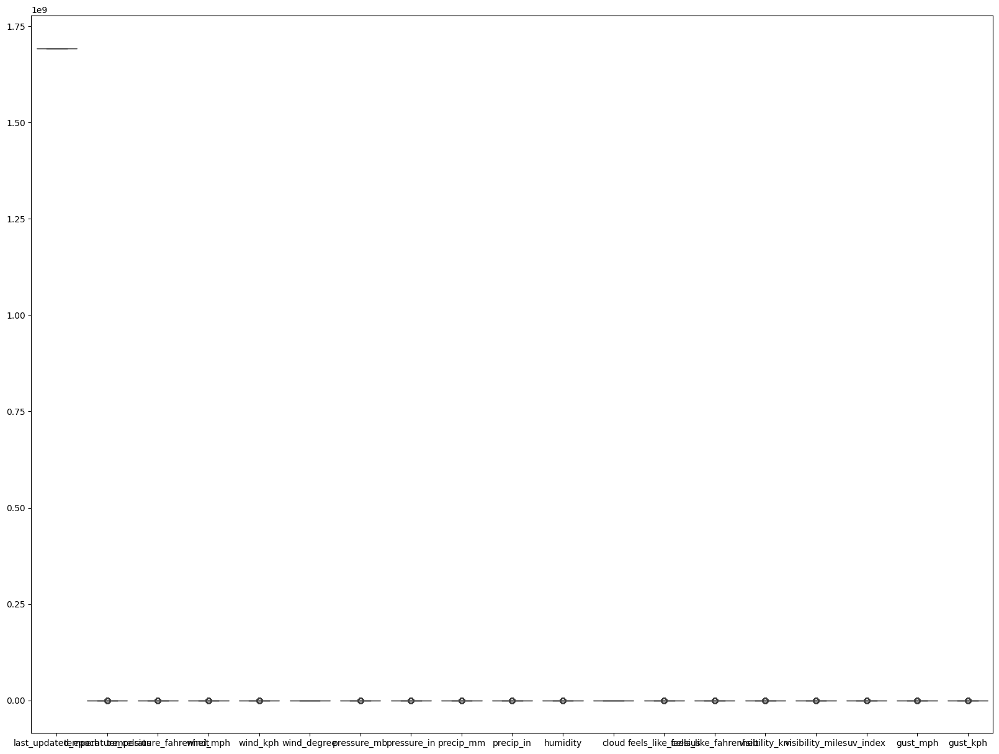

In [10]:
plt.figure(figsize=(20,15))
sns.boxplot(data)

<Axes: ylabel='count'>

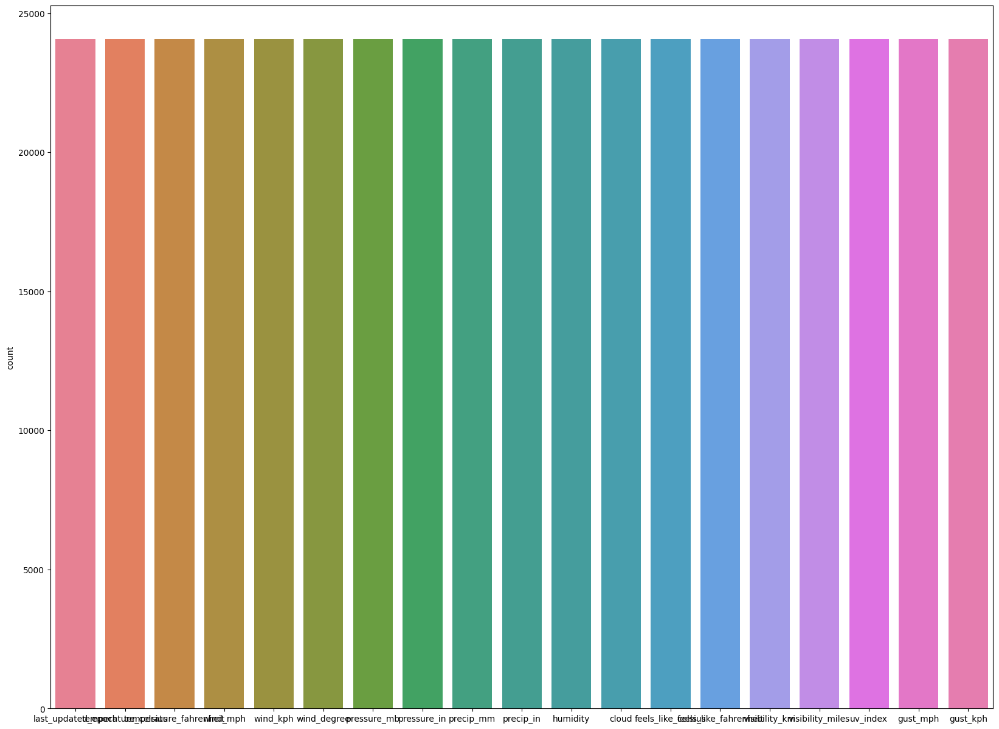

In [11]:
plt.figure(figsize=(20,15))
sns.countplot(data)

In [12]:
average_temp = data['temperature_celsius'].mean()
average_humidity = data['humidity'].mean()
average_pressure = data['pressure_mb'].mean()

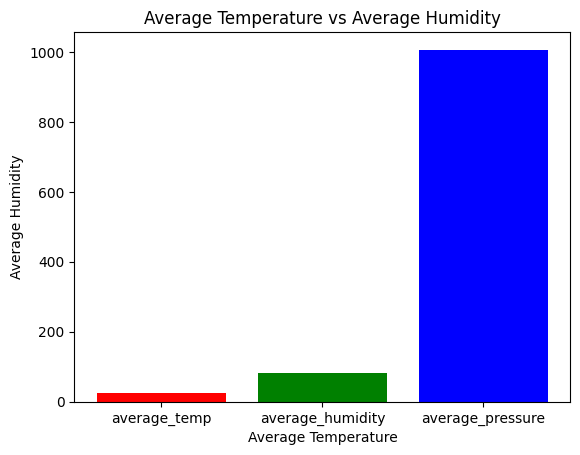

In [13]:
metrics = ['average_temp','average_humidity','average_pressure']
values = [average_temp, average_humidity, average_pressure]
plt.bar(metrics,values,color=['r','g','b'])
plt.xlabel('Average Temperature')
plt.ylabel('Average Humidity')
plt.title('Average Temperature vs Average Humidity')
plt.show()

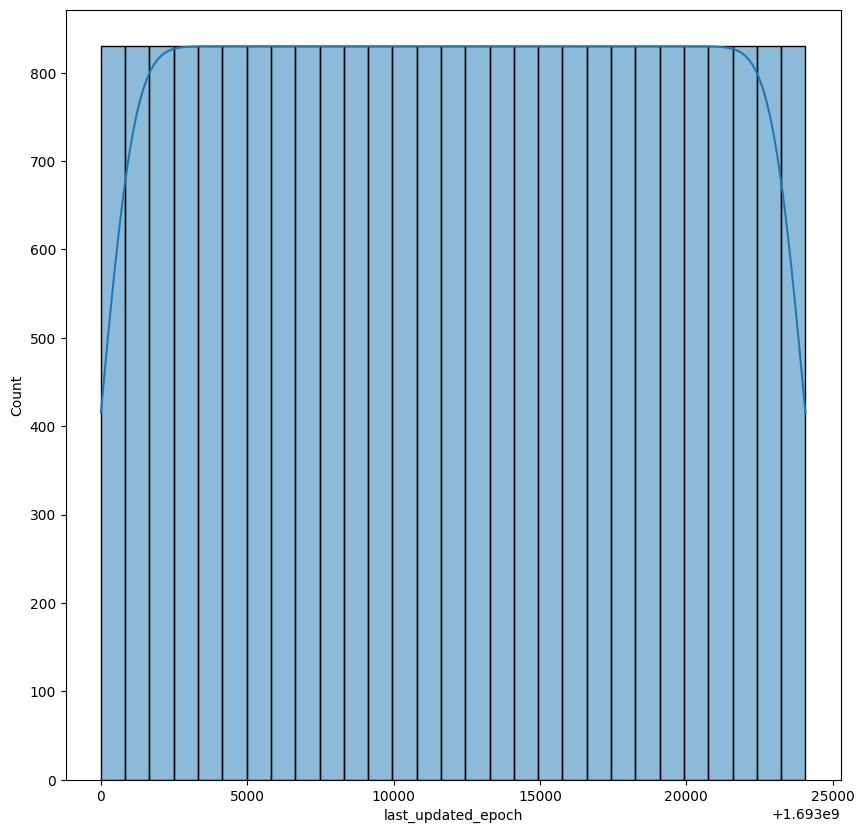

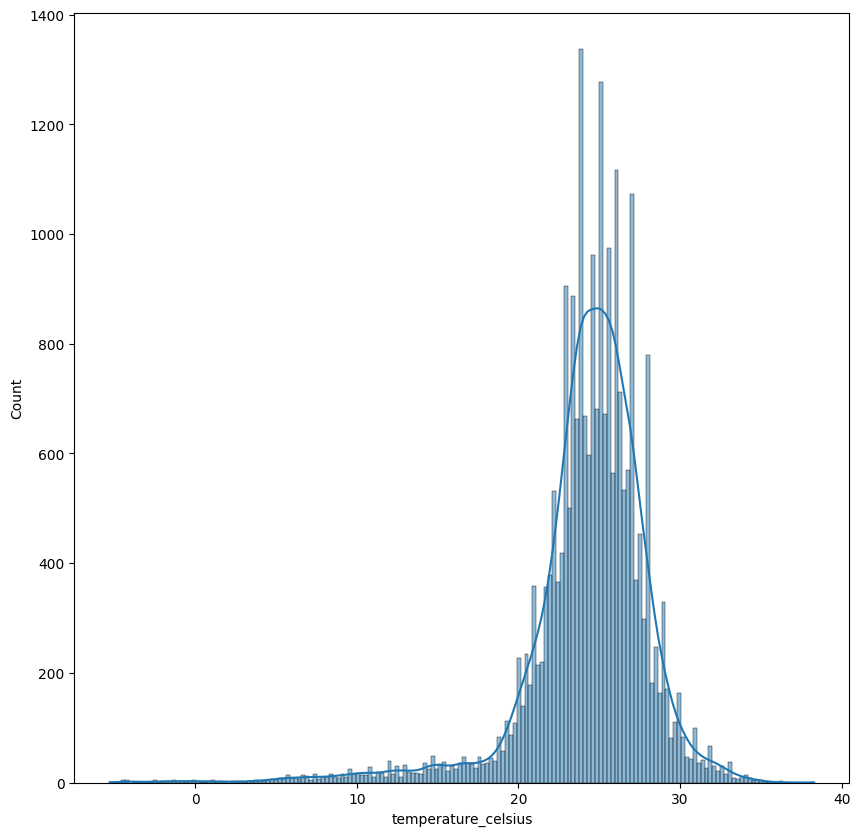

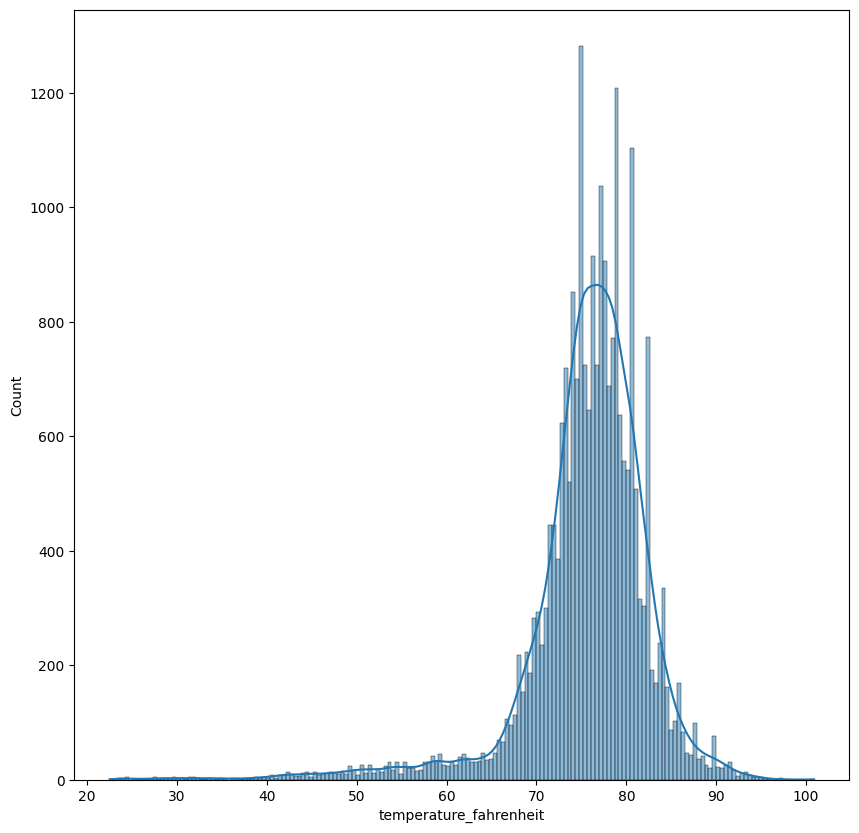

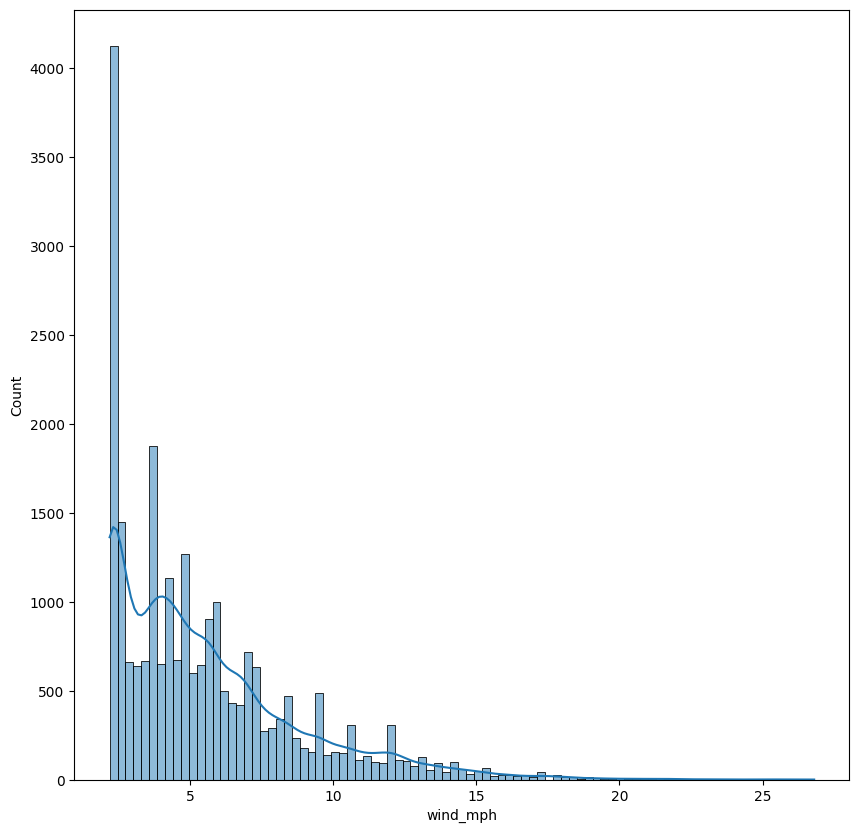

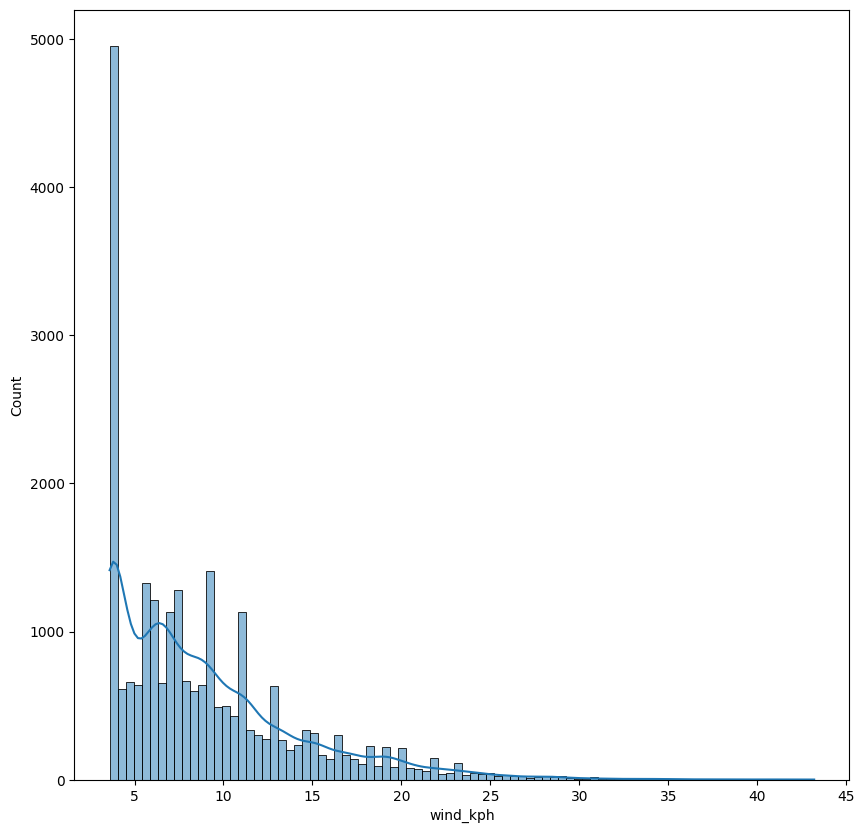

...

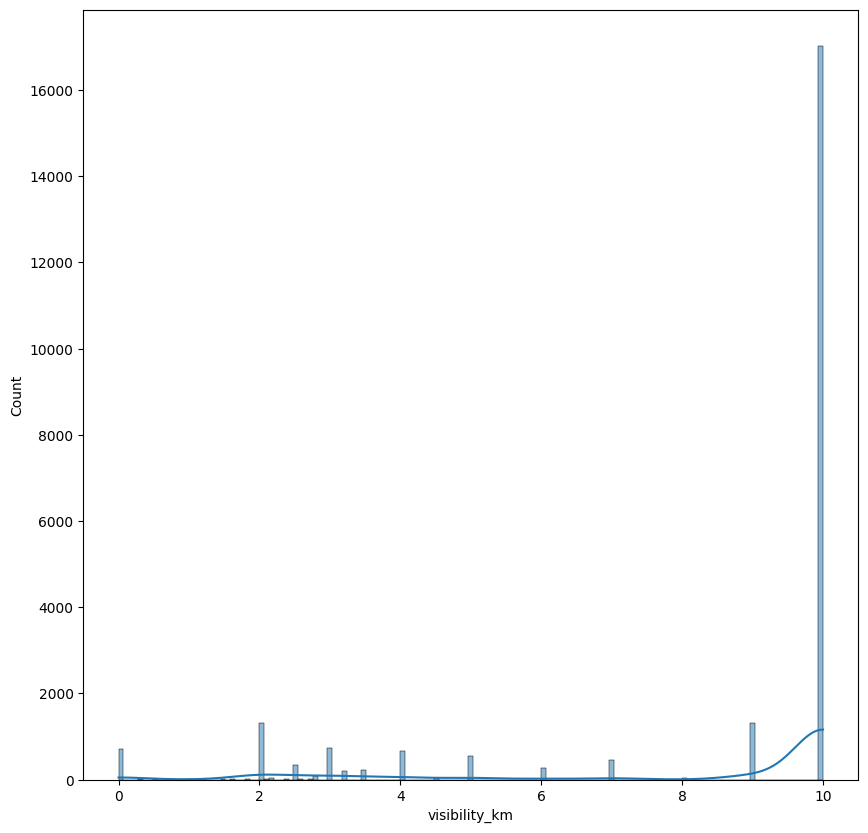

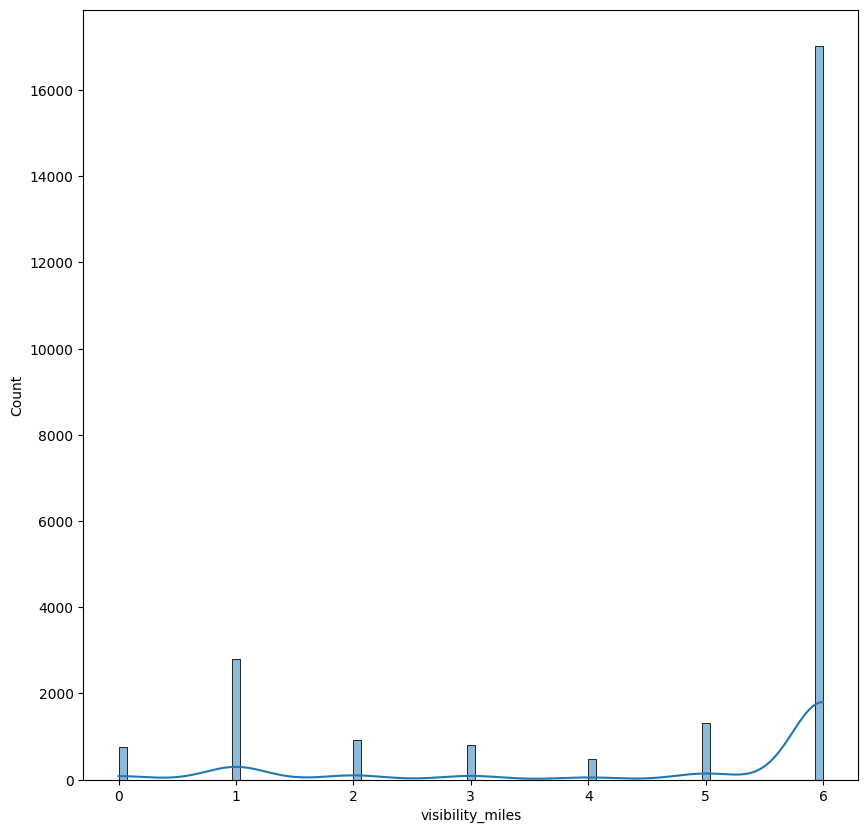

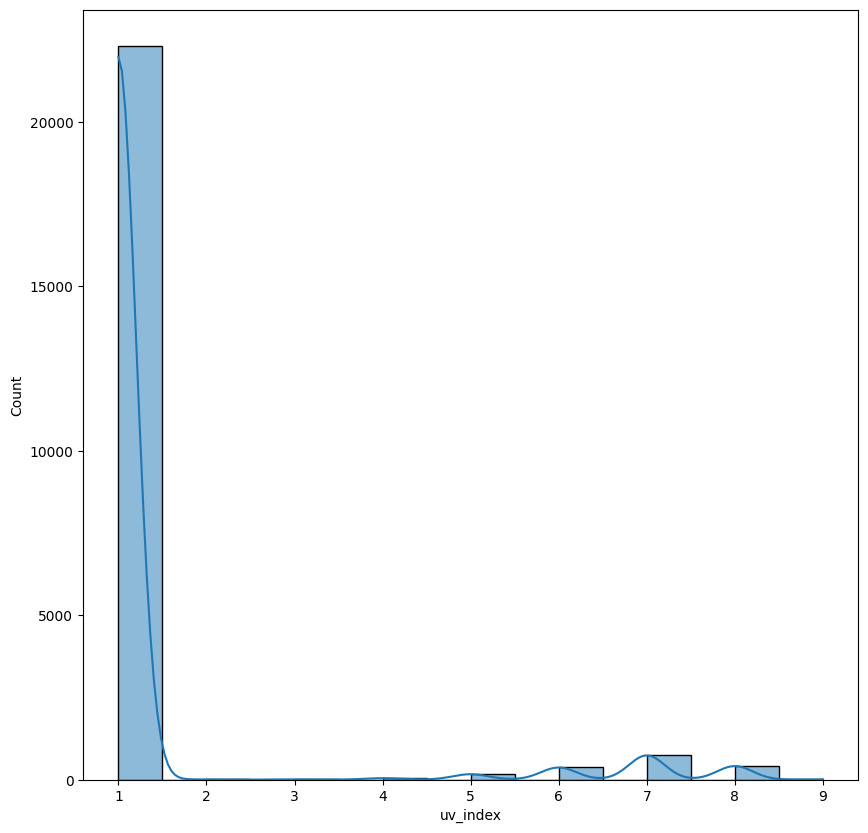

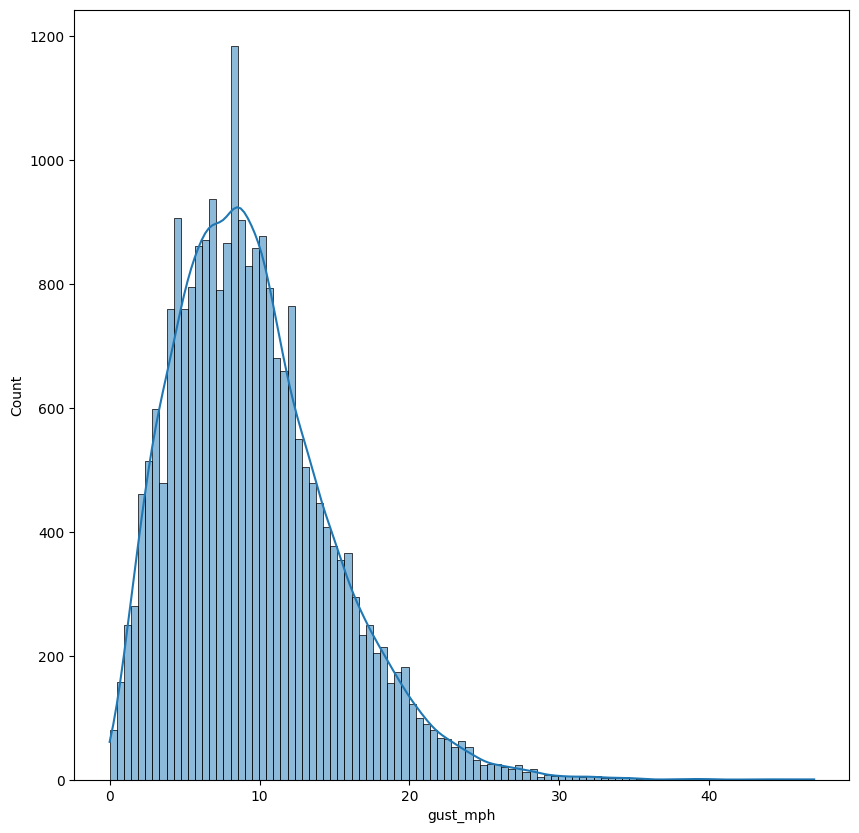

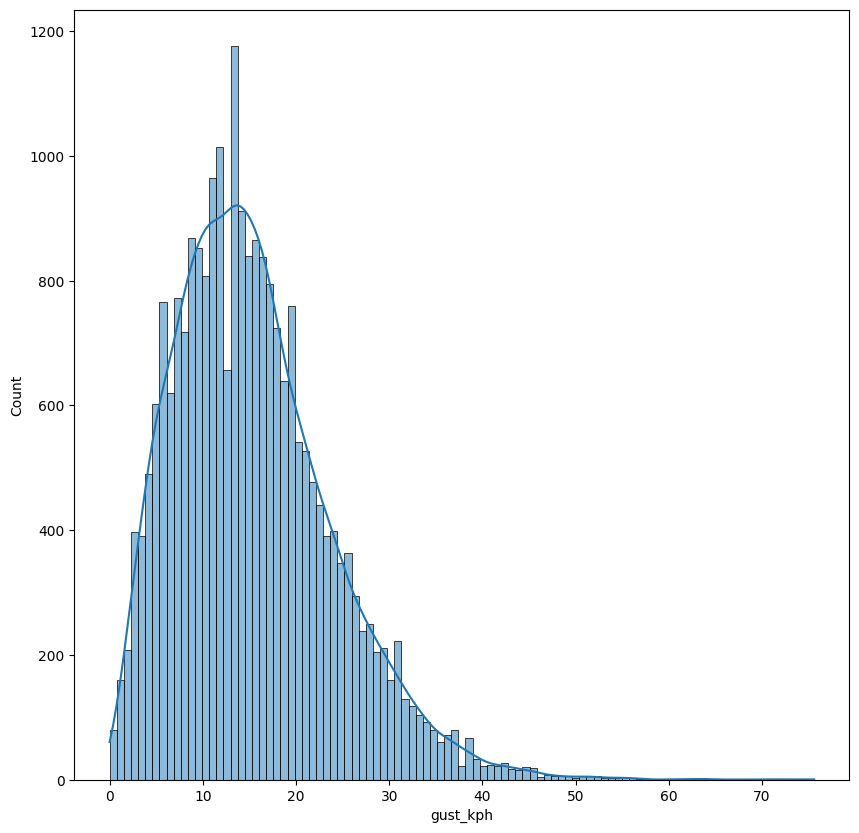

In [14]:
numerical_cols = data.select_dtypes(include=np.number).columns.tolist()
for i in numerical_cols:
  plt.figure(figsize=(10,10))
  sns.histplot(data[i],kde=True)
  plt.xlabel(i)
  plt.ylabel('Count')
  plt.show()

In [15]:
impute = SimpleImputer()
label = LabelEncoder()
categorical = data.select_dtypes(include='object').columns.tolist()
for i in categorical:
  data[i] = label.fit_transform(data[i])
data = impute.fit_transform(data)

In [16]:
df = pd.DataFrame(data)
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,1.693000e+09,27.5,81.5,12.8,20.5,281.0,14.0,1008.0,29.77,0.00,0.00,67.0,26.0,29.7,85.5,10.0,6.0,7.0,14.8,23.8
1,1.693000e+09,27.5,81.5,9.6,15.5,287.0,14.0,1008.0,29.78,0.00,0.00,70.0,19.0,30.0,86.0,10.0,6.0,7.0,11.2,18.0
2,1.693000e+09,26.3,79.3,11.4,18.4,317.0,7.0,1009.0,29.78,0.00,0.00,70.0,51.0,28.2,82.8,10.0,6.0,7.0,13.2,21.2
3,1.693000e+09,25.6,78.1,10.5,16.9,297.0,14.0,1009.0,29.80,0.00,0.00,76.0,65.0,27.6,81.7,10.0,6.0,6.0,13.0,20.9
4,1.693000e+09,27.2,81.0,10.1,16.2,274.0,13.0,1009.0,29.79,0.00,0.00,74.0,82.0,29.9,85.8,10.0,6.0,6.0,11.6,18.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24065,1.693024e+09,26.0,78.8,4.3,6.8,320.0,7.0,1010.0,29.83,0.00,0.00,70.0,0.0,26.7,80.0,2.5,1.0,1.0,8.0,12.9
24066,1.693024e+09,22.5,72.5,2.2,3.6,123.0,2.0,1011.0,29.85,0.01,0.00,99.0,100.0,25.1,77.1,0.0,0.0,1.0,1.4,2.2
24067,1.693024e+09,24.7,76.5,2.2,3.6,83.0,0.0,1009.0,29.81,0.28,0.01,90.0,71.0,27.3,81.2,9.0,5.0,1.0,3.1,4.9
24068,1.693024e+09,22.2,72.0,6.3,10.1,267.0,13.0,1011.0,29.85,0.03,0.00,88.0,75.0,24.6,76.3,10.0,6.0,1.0,11.5,18.5


<Figure size 1000x1000 with 0 Axes>

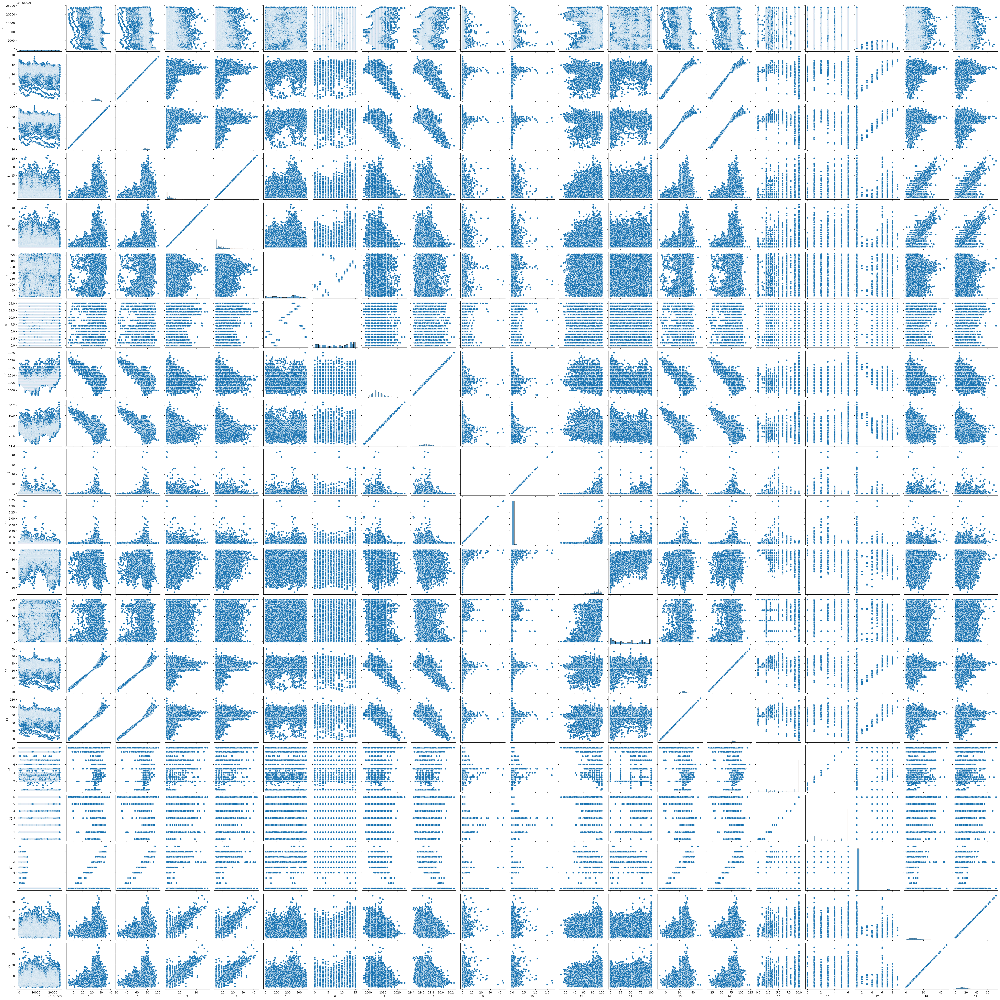

In [17]:
plt.figure(figsize=(10,10))
sns.pairplot(df)
plt.show()

In [18]:
df.corr()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,1.000000,-0.226963,-0.227010,-0.148398,-0.148410,-0.061736,-0.076671,0.308038,0.315081,-0.091538,-0.091299,-0.062781,-0.137183,-0.240553,-0.240912,-0.026587,-0.021440,-0.424307,-0.043811,-0.043852
1,-0.226963,1.000000,0.999980,0.155318,0.154717,0.121159,0.102774,-0.563663,-0.562630,-0.008386,-0.008196,-0.109270,-0.024846,0.974471,0.974456,-0.008533,-0.023800,0.287680,0.147274,0.147298
2,-0.227010,0.999980,1.000000,0.155352,0.154750,0.121121,0.102760,-0.563664,-0.562631,-0.008416,-0.008228,-0.109259,-0.024810,0.974486,0.974476,-0.008591,-0.023858,0.287740,0.147300,0.147324
3,-0.148398,0.155318,0.155352,1.000000,0.999941,0.215605,0.294295,-0.103306,-0.106725,0.062466,0.061915,-0.041127,0.090780,0.145812,0.145892,0.166352,0.165813,0.041195,0.883968,0.883942
4,-0.148410,0.154717,0.154750,0.999941,1.000000,0.214899,0.293760,-0.103027,-0.106449,0.062627,0.062073,-0.040871,0.091149,0.145184,0.145265,0.166391,0.165909,0.041313,0.883382,0.883354
5,-0.061736,0.121159,0.121121,0.215605,0.214899,1.000000,0.681478,0.071788,0.071000,-0.025197,-0.024914,-0.131093,-0.090936,0.084745,0.084781,0.134437,0.134900,0.100090,0.179029,0.179031
6,-0.076671,0.102774,0.102760,0.294295,0.293760,0.681478,1.000000,0.083193,0.081787,-0.022866,-0.022807,-0.094608,-0.067327,0.063627,0.063679,0.099549,0.101242,0.053289,0.264156,0.264160
7,0.308038,-0.563663,-0.563664,-0.103306,-0.103027,0.071788,0.083193,1.000000,0.995625,-0.089034,-0.088971,-0.154478,-0.186894,-0.587451,-0.587492,-0.028851,-0.026662,0.028072,-0.132367,-0.132351
8,0.315081,-0.562630,-0.562631,-0.106725,-0.106449,0.071000,0.081787,0.995625,1.000000,-0.089701,-0.089643,-0.153756,-0.187572,-0.586256,-0.586304,-0.034656,-0.032817,0.025537,-0.133961,-0.133941
9,-0.091538,-0.008386,-0.008416,0.062466,0.062627,-0.025197,-0.022866,-0.089034,-0.089701,1.000000,0.999452,0.180045,0.257055,0.016040,0.016042,-0.095039,-0.104276,0.009723,0.078134,0.078100


In [19]:
kf = KFold(n_splits = 10)
for train_index, test_index in kf.split(df):
    # 🔹 Train and Test Split
    train_data, test_data = df.iloc[train_index], df.iloc[test_index]

    # 🔹 Feature Columns (All Except Last Column)
    X_train, X_test = train_data.iloc[:, :-1], test_data.iloc[:, :-1]

    # 🔹 Target Column (Only Last Column)
    y_train, y_test = train_data.iloc[:, -1], test_data.iloc[:, -1]

In [20]:
rf_params = {
        "n_estimators": [50, 100, 200],
        "max_depth": [None, 10, 20],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4]
    }

In [21]:
randomforest = RandomForestRegressor(n_estimators=100, random_state=42)
randomforest.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [22]:
grid_search = GridSearchCV(randomforest, rf_params, cv=3, scoring="neg_mean_squared_error", n_jobs=-1)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=RandomForestRegressor(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [None, 10, 20],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [50, 100, 200]},
             scoring='neg_mean_squared_error')

In [23]:
best_rf = grid_search.best_estimator_

In [24]:
autokeras = ak.StructuredDataRegressor(max_trials=10, overwrite=True)
autokeras.fit(X_train,y_train,epochs = 30)

Trial 10 Complete [00h 01m 21s]
val_loss: 25.063018798828125

Best val_loss So Far: 23.40949249267578
Total elapsed time: 00h 14m 31s
Epoch 1/30
677/677 [==============================] - 3s 3ms/step - loss: 52.1458 - mean_squared_error: 52.1458
Epoch 2/30
677/677 [==============================] - 3s 4ms/step - loss: 28.1304 - mean_squared_error: 28.1304
Epoch 3/30
677/677 [==============================] - 2s 3ms/step - loss: 25.2049 - mean_squared_error: 25.2049
Epoch 4/30
677/677 [==============================] - 2s 4ms/step - loss: 23.7028 - mean_squared_error: 23.7028
Epoch 5/30
677/677 [==============================] - 3s 4ms/step - loss: 22.5443 - mean_squared_error: 22.5443
Epoch 6/30
677/677 [==============================] - 2s 3ms/step - loss: 21.7157 - mean_squared_error: 21.7157
Epoch 7/30
677/677 [==============================] - 3s 4ms/step - loss: 21.1005 - mean_squared_error: 21.1005
Epoch 8/30
677/677 [==============================] - 3s 4ms/step - loss: 20.5923 

INFO:tensorflow:Assets written to: ./structured_data_regressor/best_model/assets


In [25]:
trained_model = autokeras.export_model()
X_train_features= trained_model.predict(X_train)
X_test_features = trained_model.predict(X_test)

76/76 [==============================] - 0s 3ms/step


In [26]:
best_rf.fit(X_train_features, y_train)

RandomForestRegressor(max_depth=20, min_samples_leaf=2, min_samples_split=5,
                      n_estimators=200, random_state=42)

In [28]:
y_pred = best_rf.predict(X_test_features)
mse = mean_squared_error(y_test, y_pred)

In [29]:
y_pred

array([18.56031799, 15.08399608, 14.10963119, ...,  4.78990699,
       20.0031634 ,  8.01486957])

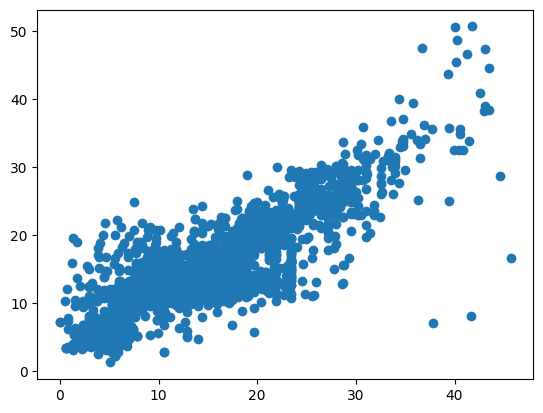

In [30]:
plt.scatter(y_test, y_pred)

/tmp/ipykernel_4271/3685675894.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y_test- y_pred)


<Axes: xlabel='19', ylabel='Density'>

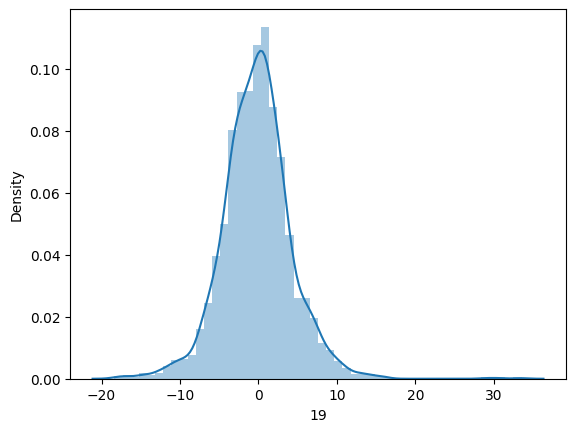

In [31]:
sns.distplot(y_test- y_pred)

In [33]:
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.linear_model import LinearRegression, LogisticRegression
accuracy = r2_score(y_test, y_pred)
accuracy

0.6852630190382195

In [35]:
radju = 1 - (((1-accuracy)*(len(data)-1))/(len(data) - len(df.columns) -1))

In [36]:
df1 = pd.DataFrame({'Real Values':y_test, 'Predicted Values':y_pred})
df1.head()

,Real Values,Predicted Values
21663,9.6,18.560318
21664,12.8,15.083996
21665,15.1,14.109631
21666,20.4,20.102155
21667,13.4,11.915246


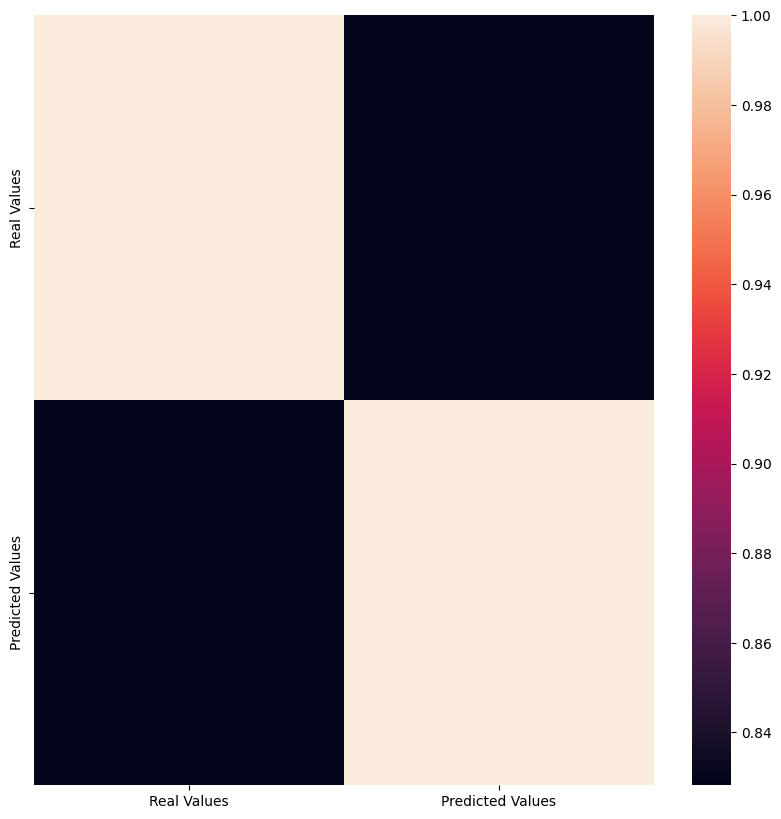

In [37]:
plt.figure(figsize=(10,10))
sns.heatmap(df1.corr())
plt.show()